# Combine datasets into a single spatially unified dataset 

In [5]:
## Import libraries
# system
import os
import time
import sys

# data manipulation
import yaml
import numpy as np
import pandas as pd
import rasterio as rio
from rasterio.enums import Resampling
import rioxarray as rxr
import xarray as xr
import dask

# dask friendliness for large rasters
dask.config.set({"array.slicing.split_large_chunks": True})

# visualization
import seaborn as sns
import matplotlib.pyplot as plt

###### setup config variables #######
repo_name = 'masterthesis_genai_spatialplan'
if not repo_name in os.getcwd():
    os.chdir(repo_name)

p=os.popen('git rev-parse --show-toplevel')
repo_dir = p.read().strip()
p.close()

# Import helper functions
sys.path.append(f"{repo_dir}/code/helpers")
from get_region_filenames import get_region_filenames

with open(f"{repo_dir}/config.yml", 'r') as stream:
    config = yaml.safe_load(stream)

regions = config['regions'] 

big_data_storage_path = config.get("big_data_storage_path", "/work/zt75vipu-master/data")
region_filenames_json = get_region_filenames(config_path=f"{repo_dir}/config.yml")
print("Region filenames JSON loaded successfully: ", region_filenames_json)

#seaborn cmap
rocket=sns.color_palette("rocket", as_cmap=True)
mako=sns.color_palette("mako", as_cmap=True)

Getting region filenames from config...
Regions to process: ['Dresden', 'Leipzig', 'Hamburg']
Region filenames JSON loaded successfully:  {'Dresden': {'landsat_zarr_name': 'D:/master_thesis/data/landsat/dresden/landsat_temperature_ge25_cc10_2019_2024.zarr', 'osm_zarr_name': 'D:/master_thesis/data/osm/dresden/osm_rasterized.zarr', 'planet_zarr_name': 'D:/master_thesis/data/planet_scope/dresden/planet_config_ge25_cc10_2019_2024.zarr', 'processed_zarr_name': 'D:/master_thesis/data/processed/dresden/input_config_ge25_cc10_2019_2024.zarr'}, 'Leipzig': {'landsat_zarr_name': 'D:/master_thesis/data/landsat/leipzig/landsat_temperature_ge25_cc10_2019_2024.zarr', 'osm_zarr_name': 'D:/master_thesis/data/osm/leipzig/osm_rasterized.zarr', 'planet_zarr_name': 'D:/master_thesis/data/planet_scope/leipzig/planet_config_ge25_cc10_2019_2024.zarr', 'processed_zarr_name': 'D:/master_thesis/data/processed/leipzig/input_config_ge25_cc10_2019_2024.zarr'}, 'Hamburg': {'landsat_zarr_name': 'D:/master_thesis/data

In [16]:
# helper: reproject/resample every variable in a Dataset
def reproject_ds(ds: xr.Dataset, template_da: xr.DataArray, resampling: Resampling) -> xr.Dataset:
    out_vars = {}
    for name, da in ds.data_vars.items():
        # carry nodata forward
        if da.rio.nodata is None and getattr(da, "_FillValue", None) is not None:
            da = da.rio.write_nodata(da._FillValue, encoded=True)
        out_vars[name] = da.rio.reproject_match(template_da, resampling=resampling)
    out = xr.Dataset(out_vars)
    # copy non-spatial coords
    for c in ds.coords:
        if c not in ("x", "y"):
            out = out.assign_coords({c: ds[c]})
    out.attrs = ds.attrs
    return out

# combine function
def combine_datasets(region=regions[0]):
    """
    Combine Planet, OSM, and Landsat datasets into a single xarray Dataset.
    Aligns datasets spatially and temporally.
    Saves the combined dataset as a Zarr file.
    
    Args:
        region (str): Region name to process. Defaults to the first region in the config.
    
    Returns:
        xr.Dataset: Combined dataset with Planet, OSM, and Landsat data.
    """


    # setup folders
    processed_region_folder = f"{big_data_storage_path}/processed/{region.lower()}"
    os.makedirs(processed_region_folder, exist_ok=True)
    filenames = region_filenames_json[region]
    processed_zarr_name = filenames['processed_zarr_name']

    if os.path.exists(processed_zarr_name):
        print(f"Processed Zarr file already exists at {processed_zarr_name}. Skipping processing.")
        return xr.open_zarr(processed_zarr_name, consolidated=True)

    drop_vars = ['qa_pixel',
    'stac_id',
    'view_sun_azimuth',
    'surface_temp_b10',
    'view_off_nadir',
    'view_sun_elevation']

    planet_xs = xr.open_zarr(filenames['planet_zarr_name'], consolidated=True)
    planet_xs = planet_xs.set_coords("spatial_ref")
    
    osm_xs = xr.open_zarr(filenames['osm_zarr_name'], consolidated=True)
    landsat_xs = xr.open_zarr(filenames['landsat_zarr_name'], consolidated=True, drop_variables=drop_vars)

    # rename surface_temp_b10 to land_surface_temp
    lst_name = "landsat_surface_temp_b10_masked"
    landsat_xs = landsat_xs.rename({"surface_temp_b10_masked": lst_name})

    # convert time to miunute precision
    landsat_xs['time'] = landsat_xs['time'].astype('datetime64[m]')
    planet_xs['time'] = planet_xs['time'].astype('datetime64[m]')

    # find nearest landsat time for each planet time and modify planet time to match
    planet_times = planet_xs['time'].values
    landsat_times = landsat_xs['time'].values
    nearest_landsat_times = np.array([landsat_times[np.abs(landsat_times - pt).argmin()] for pt in planet_times])
    planet_xs = planet_xs.assign_coords(time=nearest_landsat_times) 

    #add spatial_ref coordsinate to landsat and planet
    print("CRS of OSM dataset:", osm_xs.rio.crs)
    landsat_xs = landsat_xs.rio.write_crs(osm_xs.rio.crs, inplace=True)
    landsat_xs = landsat_xs.rio.write_coordinate_system(inplace=True)

    # rechunk to common chunk size
    common_chunks = {'x': planet_xs.chunks['x'][0], 'y': planet_xs.chunks['y'][0]}
    landsat_xs = landsat_xs.chunk(common_chunks)
    osm_xs = osm_xs.chunk(common_chunks)
    planet_xs = planet_xs.chunk(common_chunks)
    
    template = (
        planet_xs.isel(time=0)
        .rio.write_crs(planet_xs.rio.crs, inplace=False)
    )

    # ensure spatial dims are x/y for all three
    for ds in [planet_xs, landsat_xs, osm_xs]:
        if {"x","y"} - set(ds.dims):
            ds = ds.rio.set_spatial_dims(x_dim="x", y_dim="y", inplace=True)

    ## resample/reproject datasets to common grid
    print("Reprojecting and resampling datasets to common grid...")
    print(f"Target CRS: {template.rio.crs}")
    #resample/reproject osm
    osm_on_planet = reproject_ds(osm_xs, template, Resampling.nearest)

    # resample/reproject landsat lst
    if landsat_xs[lst_name].rio.nodata is None:
        landsat_xs[lst_name] = landsat_xs[lst_name].rio.write_nodata(-9999, encoded=True)

    landsat_lst_on_planet = landsat_xs[lst_name].rio.reproject_match(
        template, resampling=Resampling.bilinear
    )

    # convert no data values back to NaN
    landsat_lst_on_planet = landsat_lst_on_planet.where(landsat_lst_on_planet != -9999, np.nan)

    # rechunk to align with planet_xs
    target_chunks = {"y": planet_xs.chunks["y"][0], "x": planet_xs.chunks["x"][0]}
    osm_on_planet = osm_on_planet.chunk(target_chunks)
    if "time" in landsat_lst_on_planet.dims:
        target_chunks = {"time": 1, **target_chunks}
    landsat_lst_on_planet = landsat_lst_on_planet.chunk(target_chunks)

    # merge all three datasets
    print("Merging datasets...")
    merged_xs = xr.merge(
        [planet_xs,osm_on_planet, landsat_lst_on_planet.to_dataset(name=lst_name)],
        compat="override",
        join="outer",
        fill_value=np.nan
    )
    
    # remove chunk encoding to prevent errors
    for var in merged_xs.data_vars:
        if 'chunks' in merged_xs[var].encoding:
            del merged_xs[var].encoding['chunks']
            
    display(merged_xs)
    
    # save to zarr
    print("Saving processed Zarr file...")
    merged_xs.to_zarr(
        processed_zarr_name,
        mode="w",
        consolidated=True,
        compute=True,
    )
    print(f"Processed Zarr file saved at {processed_zarr_name}.")
    return merged_xs


merged_xs = combine_datasets(region=regions[0])

c:\Users\janne\anaconda3\envs\genaiSpatialplan\Lib\site-packages\zarr\codecs\vlen_utf8.py:43: UserWarning: The codec `vlen-utf8` is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  return cls(**configuration_parsed)


CRS of OSM dataset: EPSG:4326
Reprojecting and resampling datasets to common grid...
Target CRS: EPSG:32633
Merging datasets...


<xarray.Dataset> Size: 6GB
Dimensions:                          (channel: 4, x: 6401, y: 5816, time: 5)
Coordinates:
  * channel                          (channel) <U5 80B 'blue' 'green' ... 'nir'
  * x                                (x) float64 51kB 4.032e+05 ... 4.224e+05
  * y                                (y) float64 47kB 5.664e+06 ... 5.646e+06
  * time                             (time) datetime64[s] 40B 2019-06-24T10:0...
    spatial_ref                      (time) float64 40B dask.array<chunksize=(1,), meta=np.ndarray>
Data variables:
    ndvi                             (time, y, x) float32 745MB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    planetscope_sr_4band             (time, channel, y, x) float32 3GB dask.array<chunksize=(1, 4, 1024, 1024), meta=np.ndarray>
    landuse                          (y, x) float32 149MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    buildings_heights                (y, x) float32 149MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    buildings                        (y, x) float32 149MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    streets_surface                  (y, x) float32 149MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    water                            (y, x) float32 149MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    buildings_service                (y, x) float32 149MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    streets                          (y, x) float32 149MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    streets_service                  (y, x) float32 149MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    landsat_surface_temp_b10_masked  (time, y, x) float32 745MB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>

Saving processed Zarr file...


C:\Users\janne\AppData\Local\Temp\ipykernel_31544\683008927.py:132: SerializationWarning: saving variable None with floating point data as an integer dtype without any _FillValue to use for NaNs
  merged_xs.to_zarr(
c:\Users\janne\anaconda3\envs\genaiSpatialplan\Lib\site-packages\zarr\core\dtype\npy\string.py:248: UnstableSpecificationWarning: The data type (FixedLengthUTF32(length=5, endianness='little')) does not have a Zarr V3 specification. That means that the representation of arrays saved with this data type may change without warning in a future version of Zarr Python. Arrays stored with this data type may be unreadable by other Zarr libraries. Use this data type at your own risk! Check https://github.com/zarr-developers/zarr-extensions/tree/main/data-types for the status of data type specifications for Zarr V3.
  v3_unstable_dtype_warning(self)
c:\Users\janne\anaconda3\envs\genaiSpatialplan\Lib\site-packages\zarr\api\asynchronous.py:229: UserWarning: Consolidated metadata is cu

Processed Zarr file saved at D:/master_thesis/data/processed/dresden/input_config_ge25_cc10_2019_2024.zarr.


In [17]:
processed_zarr_name = get_region_filenames(config_path=f"{repo_dir}/config.yml")[regions[0]]['processed_zarr_name']
merged_xs = xr.open_zarr(processed_zarr_name, consolidated=True)

Getting region filenames from config...
Regions to process: ['Dresden', 'Leipzig', 'Hamburg']


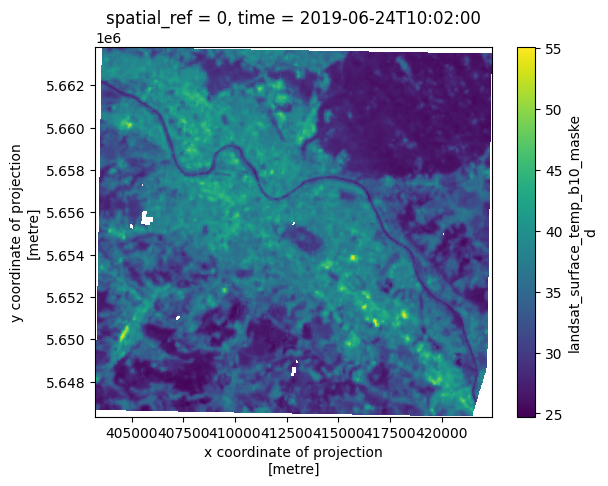

In [18]:
merged_xs.isel(time=0).landsat_surface_temp_b10_masked.plot()

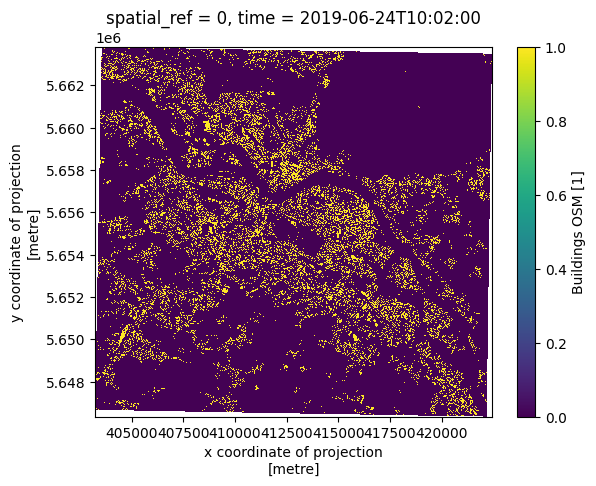

In [19]:
merged_xs.isel(time=0).buildings.plot()

Number of valid PlanetScope dates: 2


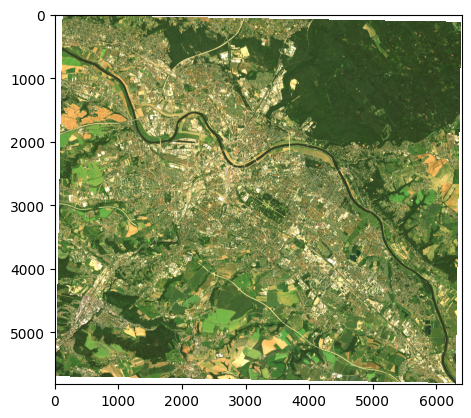

In [20]:
# get all dates where not null count of planet bands >0
valid_planet_dates = (merged_xs['planetscope_sr_4band'].notnull().sum(dim=['x', 'y']) > 0).any(dim='channel').compute()
valid_planet_dates = merged_xs['time'].where(valid_planet_dates, drop=True).values
print(f"Number of valid PlanetScope dates: {len(valid_planet_dates)}")

reflectance = merged_xs.planetscope_sr_4band.sel(time=valid_planet_dates[0])

rgb = np.stack([
    reflectance.isel(channel=2),
    reflectance.isel(channel=1),
    reflectance.isel(channel=0)
], axis=-1)

rgb = np.clip(rgb / np.nanpercentile(rgb, 98), 0, 1)
plt.imshow(rgb)
plt.show()
plt.close()

### Plot side by side

In [ ]:
from functools import reduce
import random
import json

def plot_img_array(img_array, ncol=3):
    nrow = len(img_array) // ncol

    f, plots = plt.subplots(nrow, ncol, sharex='all', sharey='all', figsize=(ncol * 4, nrow * 4))

    for i in range(len(img_array)):
        plots[i // ncol, i % ncol]
        plots[i // ncol, i % ncol].imshow(img_array[i])

def plot_side_by_side(img_arrays):
    flatten_list = reduce(lambda x,y: x+y, zip(*img_arrays))

    plot_img_array(np.array(flatten_list), ncol=len(img_arrays))

In [ ]:
def mask_to_colorimg(mask, class_dict=None, custom_colors=None, random_seed=42):
    """
    Convert a class mask to a colored image.
    
    Args:
        mask: 2D numpy array with class indices
        class_dict: Dictionary mapping class indices to class names (optional)
        custom_colors: Optional dict mapping class values to RGB colors
        random_seed: Seed for random color generation to ensure consistency
    
    Returns:
        RGB image as numpy array with shape (height, width, 3)
    """
    # Set random seed for reproducible colors
    random.seed(random_seed)
    
    # Generate distinct colors 
    if custom_colors is None:
        distinct_colors = [
            [0,0,0],      # Black
            [255, 0, 0],    # Red
            [0, 255, 0],    # Green
            [0, 0, 255],    # Blue
            [255, 255, 0],  # Yellow
            [255, 0, 255],  # Magenta
            [0, 255, 255],  # Cyan
            [128, 0, 0],    # Maroon
            [0, 128, 0],    # Dark Green
            [0, 0, 128],    # Navy
            [128, 128, 0],  # Olive
            [128, 0, 128],  # Purple
            [0, 128, 128],  # Teal
            [192, 192, 192],# Silver
            [128, 128, 128],# Gray
            [255, 165, 0],  # Orange
        ]
        
        # Map each class to a color
        color_map = {}
        if class_dict is not None:
            # map classes to colors
            for i, class_label in enumerate(class_dict.values()):
                if i < len(distinct_colors):
                    color_map[class_label] = distinct_colors[i]
                else:
                    # Fall back to random colors if more classes than distinct colors
                    color_map[class_label] = [random.randint(0, 255) for _ in range(3)]
        else:
            # use unique values from the mask
            unique_values = np.unique(mask)
            for i, val in enumerate(unique_values):
                if i < len(distinct_colors):
                    color_map[val] = distinct_colors[i]
                else:
                    color_map[val] = [random.randint(0, 255) for _ in range(3)]
    else:
        # Use custom color mapping if provided
        color_map = custom_colors
    
    # Default color for undefined classes
    default_color = [0, 0, 0]  # Black
    
    # Convert the mask to a color image
    flat_mask = mask.flatten()
    colorimg = np.array([color_map.get(val, default_color) for val in flat_mask])
    
    return colorimg.reshape(mask.shape + (3,))

In [ ]:
# get valid planet dates
valid_planet_dates = (merged_xs['planetscope_sr_4band'].notnull().sum(dim=['x', 'y']) > 0).any(dim='channel').compute()
valid_planet_dates = merged_xs['time'].where(valid_planet_dates, drop=True).values

# Load the rgb bands from PlanetScope
planet_data = merged_xs.planetscope_sr_4band.sel(time=valid_planet_dates[0])
blue_band = planet_data.sel(channel='blue')
green_band = planet_data.sel(channel='green')
red_band = planet_data.sel(channel='red')
nir_band = planet_data.sel(channel='nir')

# Stack these into an RGB image for input
rgb_image = np.stack([red_band, green_band, blue_band], axis=-1) 

# Percentile-based contrast stretch
p_low, p_high = 2, 98
rgb_min = np.nanpercentile(rgb_image, p_low)
rgb_max = np.nanpercentile(rgb_image, p_high)
rgb_image = np.clip((rgb_image - rgb_min) / (rgb_max - rgb_min), 0, 1)


# Load target masks for landuse, buildings, and streets
ndvi_mask = merged_xs.ndvi.sel(time=valid_planet_dates[0]).values
landuse_mask = merged_xs.landuse.values
buildings_mask = merged_xs.buildings.values
buildings_service_mask = merged_xs.buildings_service.values
buildings_height_mask = merged_xs.buildings_heights.values
streets_mask = merged_xs.streets.values
streets_surface_mask = merged_xs.streets_surface.values
streets_service_mask = merged_xs.streets_service.values
water_mask = merged_xs.water.values
# lst_mask = merged_xs.landsat_surface_temp_b10_masked.drop_sel(time=merged_xs.planetscope_sr_4band.time[1].values).sel(time=pd.to_datetime(merged_xs.planetscope_sr_4band.time[1].values), method="nearest").values
lst_mask = merged_xs.landsat_surface_temp_b10_masked.sel(time=valid_planet_dates[0]).values

In [ ]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
# Convert masks to RGB
ndvi_mask_rgb = mask_to_colorimg(ndvi_mask, custom_colors={0: [0, 0, 0], 1: [0, 255, 0]})
landuse_mask_rgb = mask_to_colorimg(landuse_mask, json.loads(merged_xs.landuse.attrs["landuse_mapping"]))
buildings_mask_rgb = mask_to_colorimg(buildings_mask)
buildings_services_mask_rgb = mask_to_colorimg(buildings_service_mask, json.loads(merged_xs.buildings_service.attrs["buildings_service_mapping"]))
buildings_height_mask_rgb = mask_to_colorimg(buildings_height_mask)
streets_mask_rgb = mask_to_colorimg(streets_mask)
streets_surface_mask_rgb = mask_to_colorimg(streets_surface_mask, json.loads(merged_xs.streets_surface.attrs["streets_surface_mapping"]))
streets_service_mask_rgb = mask_to_colorimg(streets_service_mask, json.loads(merged_xs.streets_service.attrs["streets_service_mapping"]))
water_mask_rgb = mask_to_colorimg(water_mask, json.loads(merged_xs.water.attrs["water_mapping"]))

In [ ]:
def plot_side_by_side(images, cmap_secondary=None):
    fig, axes = plt.subplots(1, len(images), figsize=(10, 5))
    for i, img in enumerate(images):
        if cmap_secondary is not None and i == 1:
            axes[i].imshow(img, cmap=cmap_secondary)
        else:
            axes[i].imshow(img)
        axes[i].axis('off')
    plt.show()

plot_side_by_side([rgb_image, ndvi_mask], cmap_secondary='RdYlGn')
plot_side_by_side([rgb_image, landuse_mask_rgb])
plot_side_by_side([rgb_image, buildings_mask_rgb])
plot_side_by_side([rgb_image, buildings_services_mask_rgb])
plot_side_by_side([rgb_image, buildings_height_mask_rgb])
plot_side_by_side([rgb_image, streets_mask_rgb])
plot_side_by_side([rgb_image, streets_surface_mask_rgb])
plot_side_by_side([rgb_image, streets_service_mask_rgb])
plot_side_by_side([rgb_image, water_mask_rgb])
plot_side_by_side([rgb_image, lst_mask], cmap_secondary='rocket')

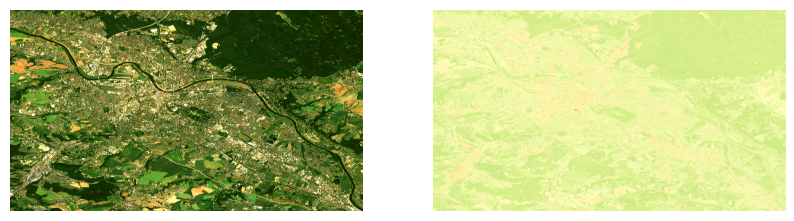

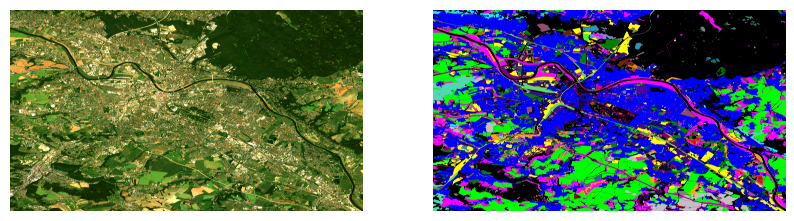

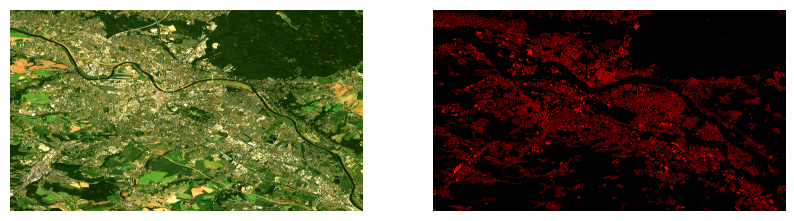

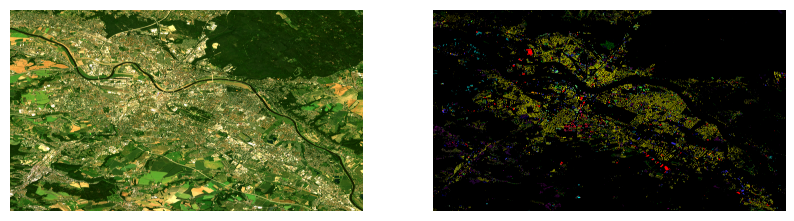

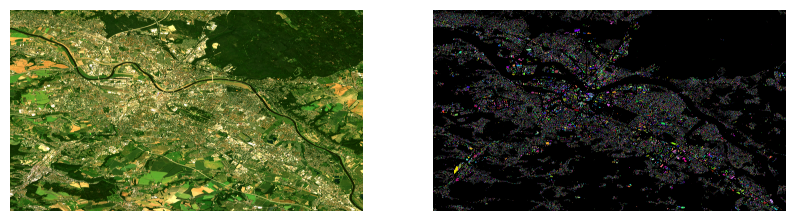

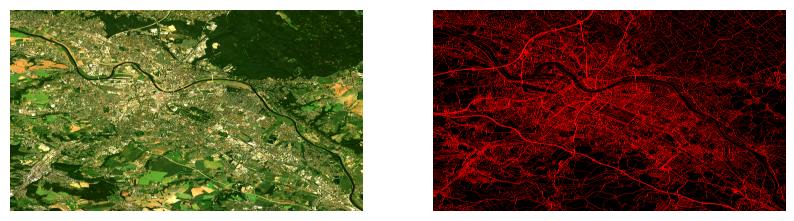

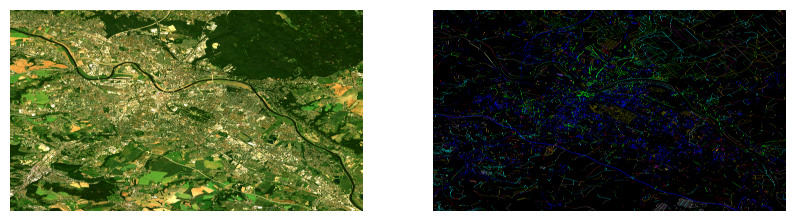

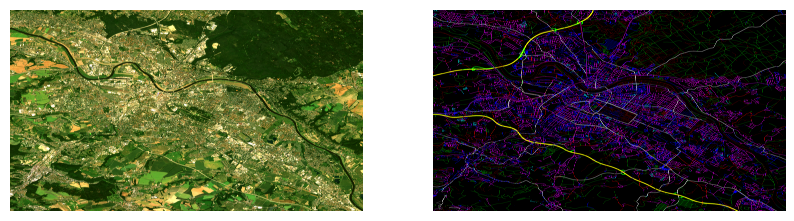

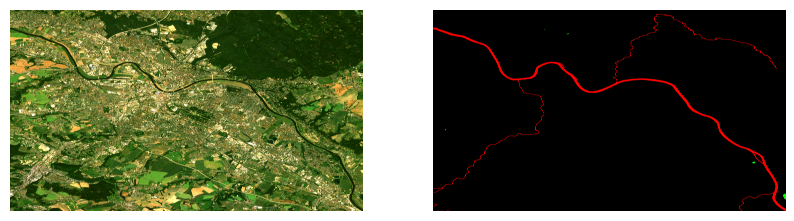

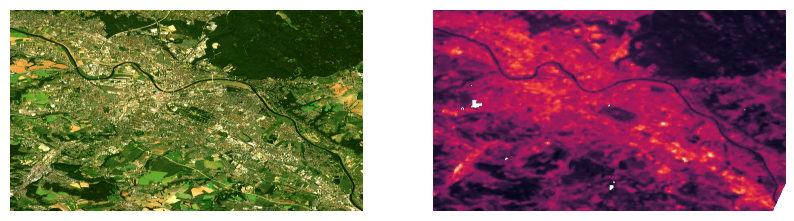

In [20]:
def plot_side_by_side(images, cmap_secondary=None):
    fig, axes = plt.subplots(1, len(images), figsize=(10, 5))
    for i, img in enumerate(images):
        if cmap_secondary is not None and i == 1:
            axes[i].imshow(img, cmap=cmap_secondary)
        else:
            axes[i].imshow(img)
        axes[i].axis('off')
    plt.show()

plot_side_by_side([rgb_image, ndvi_mask], cmap_secondary='RdYlGn')
plot_side_by_side([rgb_image, landuse_mask_rgb])
plot_side_by_side([rgb_image, buildings_mask_rgb])
plot_side_by_side([rgb_image, buildings_services_mask_rgb])
plot_side_by_side([rgb_image, buildings_height_mask_rgb])
plot_side_by_side([rgb_image, streets_mask_rgb])
plot_side_by_side([rgb_image, streets_surface_mask_rgb])
plot_side_by_side([rgb_image, streets_service_mask_rgb])
plot_side_by_side([rgb_image, water_mask_rgb])
plot_side_by_side([rgb_image, lst_mask], cmap_secondary='rocket')

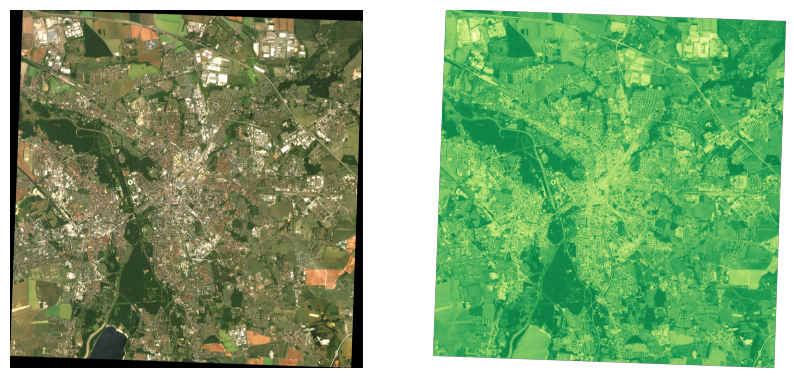

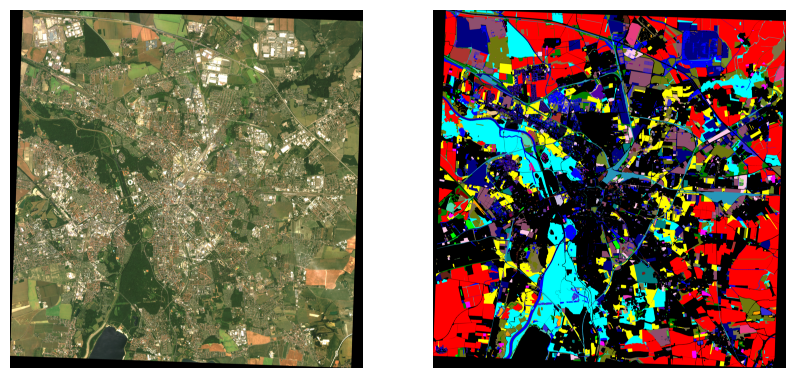

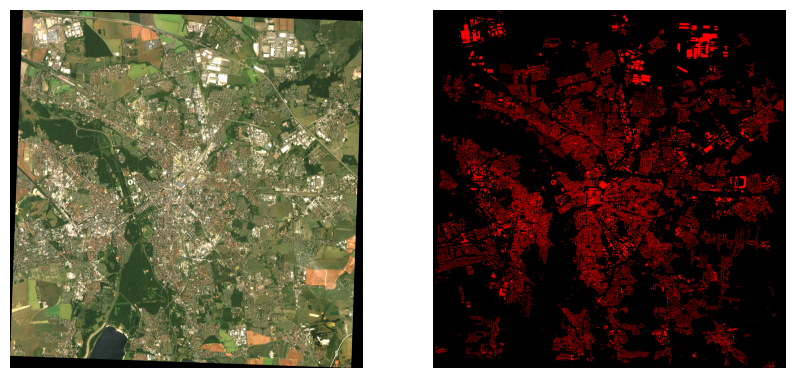

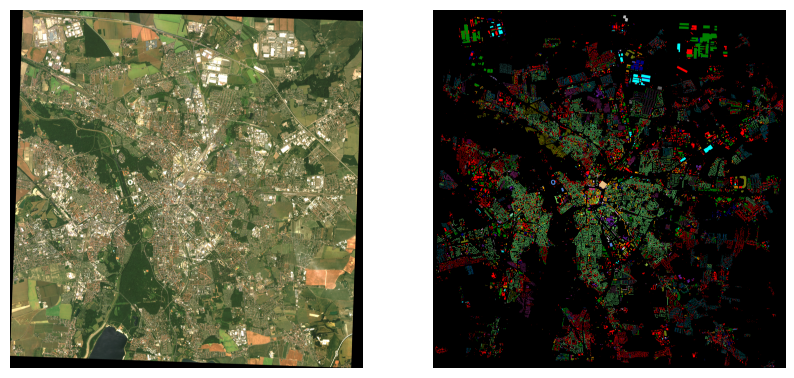

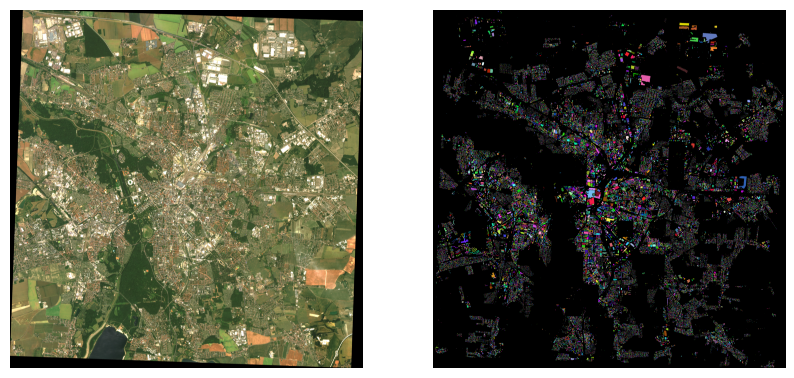

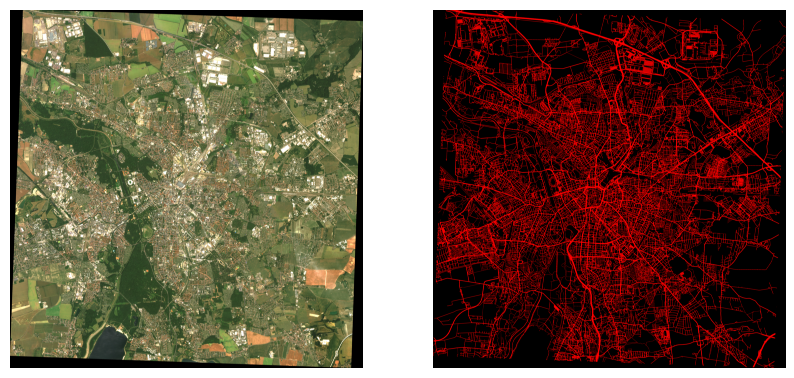

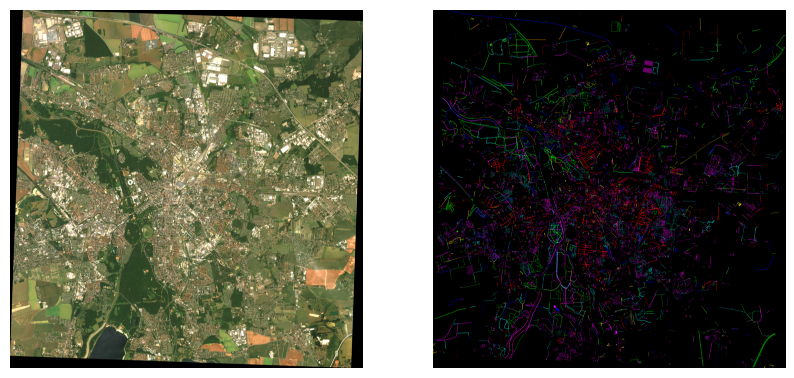

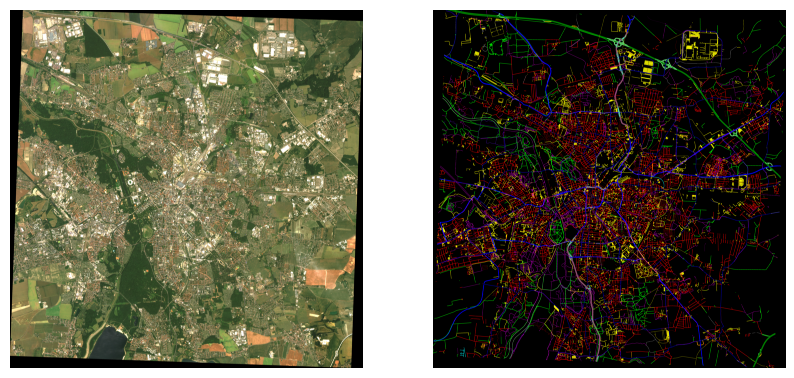

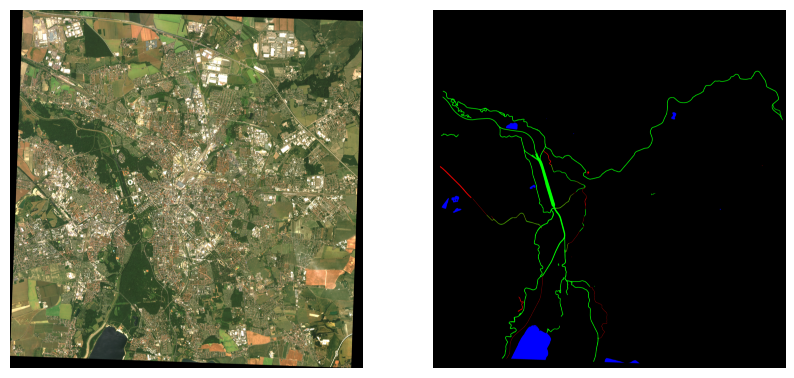

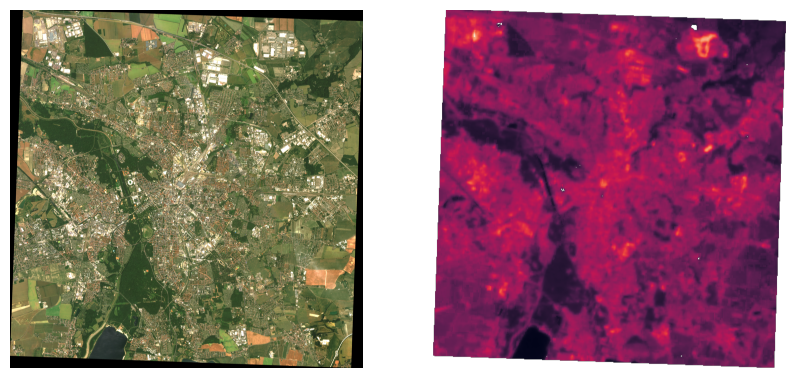

In [12]:
def plot_side_by_side(images, cmap_secondary=None):
    fig, axes = plt.subplots(1, len(images), figsize=(10, 5))
    for i, img in enumerate(images):
        if cmap_secondary is not None and i == 1:
            axes[i].imshow(img, cmap=cmap_secondary)
        else:
            axes[i].imshow(img)
        axes[i].axis('off')
    plt.show()

plot_side_by_side([rgb_image, ndvi_mask], cmap_secondary='RdYlGn')
plot_side_by_side([rgb_image, landuse_mask_rgb])
plot_side_by_side([rgb_image, buildings_mask_rgb])
plot_side_by_side([rgb_image, buildings_services_mask_rgb])
plot_side_by_side([rgb_image, buildings_height_mask_rgb])
plot_side_by_side([rgb_image, streets_mask_rgb])
plot_side_by_side([rgb_image, streets_surface_mask_rgb])
plot_side_by_side([rgb_image, streets_service_mask_rgb])
plot_side_by_side([rgb_image, water_mask_rgb])
plot_side_by_side([rgb_image, lst_mask], cmap_secondary='rocket')